In [12]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/wh-demo/populations_clean.csv
/kaggle/input/wh-demo/countries_areas.csv
/kaggle/input/wh-demo/battles_clean.csv


In [13]:
populations = pd.read_csv('/kaggle/input/wh-demo/populations_clean.csv')
countries = pd.read_csv('/kaggle/input/wh-demo/countries_areas.csv')
battles = pd.read_csv('/kaggle/input/wh-demo/battles_clean.csv', encoding = 'latin-1')

In [14]:
battles.columns

Index(['Unnamed: 0', 'id', 'war', 'area', 'year', 'duration', 'LZ_scale',
       'participants', 'winner', 'loser', 'latitude', 'longitude'],
      dtype='object')

In [15]:
countries.columns

Index(['Unnamed: 0', 'area', 'region', 'area_km2'], dtype='object')

In [16]:
populations.columns

Index(['Unnamed: 0', 'area', 'code', 'year', 'pop_estimate'], dtype='object')

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



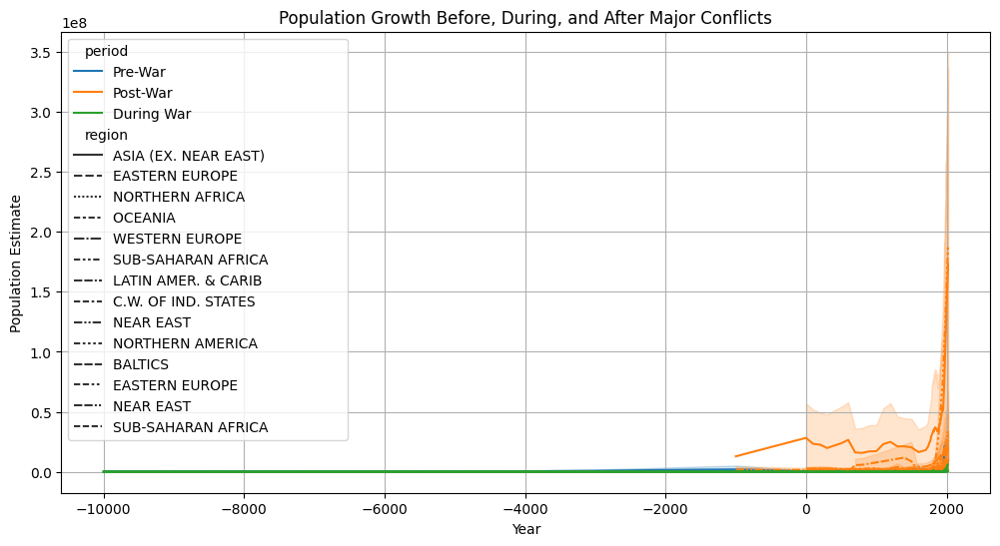

In [17]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt



# Merge countries data to include region information into populations and battles data
population_with_region = pd.merge(populations, countries[['area', 'region']], on='area', how='left')

# Define war start year for each region based on the battles data
war_years = battles.groupby('area')['year'].min().reset_index().rename(columns={'year': 'war_start_year'})

# Merge war start year with population data
pop_war_merged = pd.merge(population_with_region, war_years, on='area', how='left')

# Classify time periods into pre-war, during-war, and post-war
pop_war_merged['period'] = pop_war_merged.apply(
    lambda x: 'Pre-War' if x['year'] < x['war_start_year'] 
    else ('Post-War' if x['year'] > x['war_start_year'] else 'During War'), axis=1
)

# Plot population trends over time for each period and region
plt.figure(figsize=(12, 6))
sns.lineplot(data=pop_war_merged, x='year', y='pop_estimate', hue='period', style='region')

plt.title('Population Growth Before, During, and After Major Conflicts')
plt.xlabel('Year')
plt.ylabel('Population Estimate')
plt.grid(True)
plt.show()


Index(['Unnamed: 0', 'area', 'code', 'year', 'pop_estimate', 'area_km2'], dtype='object')


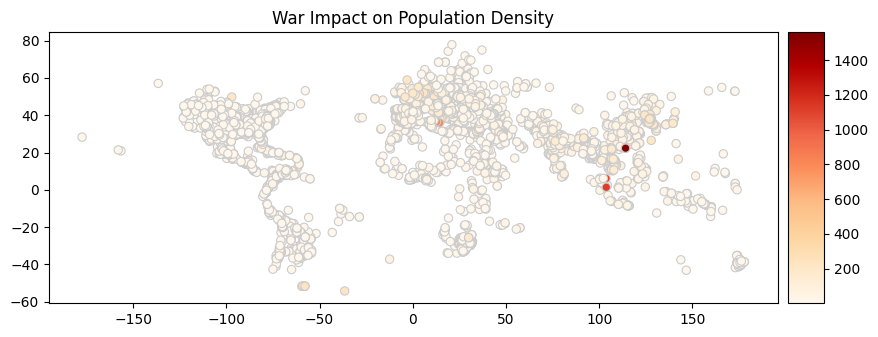

In [18]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable

# Merge 'area_km2' from countries into populations based on 'area'
populations_with_area = pd.merge(populations, countries[['area', 'area_km2']], on='area', how='left')

# Check if 'area_km2' exists
print(populations_with_area.columns)  # This should now contain 'area_km2'

# Create population density column
populations_with_area['pop_density'] = populations_with_area['pop_estimate'] / populations_with_area['area_km2']

# Filter population data for war periods (using battles data)
war_periods = pd.merge(populations_with_area, battles, on=['area', 'year'], how='inner')

# Create GeoDataFrame using latitude and longitude from war_periods
gdf = gpd.GeoDataFrame(war_periods, geometry=gpd.points_from_xy(war_periods.longitude, war_periods.latitude))

# Plotting the map
fig, ax = plt.subplots(figsize=(10, 8))
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)

# Plot GeoDataFrame with color based on population density
gdf.plot(column='pop_density', cmap='OrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True, cax=cax)
ax.set_title('War Impact on Population Density')
plt.show()


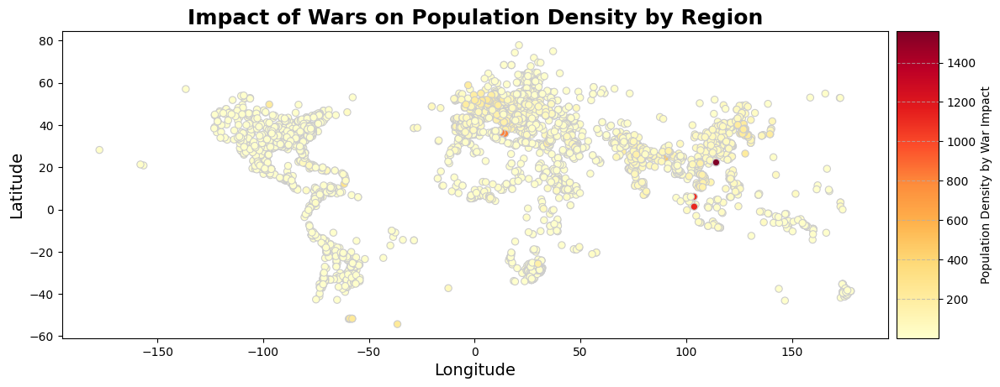

In [19]:
populations_with_area = pd.merge(populations, countries[['area', 'area_km2']], on='area', how='left')

# Create population density column
populations_with_area['pop_density'] = populations_with_area['pop_estimate'] / populations_with_area['area_km2']

# Filter population data for war periods (using battles data)
war_periods = pd.merge(populations_with_area, battles[['area', 'year', 'longitude', 'latitude']], on=['area', 'year'], how='inner')

# Create GeoDataFrame using latitude and longitude from war_periods
gdf = gpd.GeoDataFrame(war_periods, geometry=gpd.points_from_xy(war_periods['longitude'], war_periods['latitude']))

# Drop rows with missing geometry
gdf = gdf.dropna(subset=['geometry'])

# Plotting the map
fig, ax = plt.subplots(figsize=(12, 10))  # Larger figure size for better readability

# Add a title and labels for clarity
ax.set_title('Impact of Wars on Population Density by Region', fontsize=18, fontweight='bold')
ax.set_xlabel('Longitude', fontsize=14)
ax.set_ylabel('Latitude', fontsize=14)

# Make a colorbar for population density
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)

# Plot GeoDataFrame
gdf.plot(column='pop_density', cmap='YlOrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True, cax=cax, legend_kwds={'label': "Population Density by War Impact"})

# Improve layout and add grid
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()

plt.show()

In [20]:
import folium
populations_with_area = pd.merge(populations, countries[['area', 'area_km2']], on='area', how='left')

# Create population density column
populations_with_area['pop_density'] = populations_with_area['pop_estimate'] / populations_with_area['area_km2']

# Filter population data for war periods (using battles data)
war_periods = pd.merge(populations_with_area, battles[['area', 'year', 'longitude', 'latitude']], on=['area', 'year'], how='inner')

# Initialize a Folium map
m = folium.Map(location=[0, 0], zoom_start=2, tiles='CartoDB positron')

# Add markers for each war period location
for _, row in war_periods.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=row['pop_density'] / 1000,  # Scale the radius based on population density
        color='red' if row['pop_density'] > 1000 else 'orange',  # Color based on density
        fill=True,
        fill_color='red' if row['pop_density'] > 1000 else 'orange',
        fill_opacity=0.6,
        popup=folium.Popup(
            f"<b>Country:</b> {row['area']}<br>"
            f"<b>Year:</b> {row['year']}<br>"
            f"<b>Population Density:</b> {row['pop_density']:.2f}",
            max_width=300
        )
    ).add_to(m)

# Save map to HTML file
m.save('interactive_map_with_countries.html')

In [21]:
import plotly.express as px

populations_with_area = pd.merge(populations, countries[['area', 'area_km2']], on='area', how='left')

# Create population density column
populations_with_area['pop_density'] = populations_with_area['pop_estimate'] / populations_with_area['area_km2']

# Filter population data for war periods (using battles data)
war_periods = pd.merge(populations_with_area, battles[['area', 'year', 'longitude', 'latitude']], on=['area', 'year'], how='inner')

# Create an interactive scatter map with Plotly
fig = px.scatter_geo(
    war_periods,
    lat='latitude',
    lon='longitude',
    color='pop_density',
    size='pop_density',
    hover_name='area',  # This will show the country name on hover
    hover_data={'pop_density': True, 'year': True},
    color_continuous_scale='YlOrRd',
    projection='natural earth',
    title='Impact of Wars on Population Density'
)

# Update layout for better appearance
fig.update_layout(
    title='Impact of Wars on Population Density',
    geo=dict(
        scope='world',
        showland=True,
        landcolor='rgb(250, 250, 250)',
        showocean=True,
        oceancolor='rgb(204, 204, 255)',
    ),
    coloraxis_colorbar=dict(
        title='Population Density'
    )
)

# Show plot
fig.show()

In [22]:
# war_years = battles.groupby('area')['year'].min().reset_index().rename(columns={'year': 'war_start_year'})

# # Merge the war start year with population data
# pop_war_merged = pd.merge(populations, war_years, on='area', how='left')

# # Classify time periods into pre-war, during-war, post-war
# pop_war_merged['period'] = pop_war_merged.apply(
#     lambda x: 'Pre-War' if x['year'] < x['war_start_year'] 
#     else ('Post-War' if x['year'] > x['war_start_year'] else 'During War'), axis=1
# )

# # Plot population trends over time for each period
# plt.figure(figsize=(14, 8))
# sns.lineplot(data=pop_war_merged, x='year', y='pop_estimate', hue='period', style='area')

# plt.title('Population Growth Before, During, and After Major Conflicts', fontsize=16)
# plt.xlabel('Year', fontsize=14)
# plt.ylabel('Population Estimate', fontsize=14)
# plt.legend(title='Period')
# plt.grid(True)
# plt.tight_layout()
# plt.show()


In [23]:
# war_years = battles.groupby('area')['year'].min().reset_index().rename(columns={'year': 'war_start_year'})

# # Merge the war start year with population data
# pop_war_merged = pd.merge(populations, war_years, on='area', how='left')

# # Classify time periods into pre-war, during-war, post-war
# pop_war_merged['period'] = pop_war_merged.apply(
#     lambda x: 'Pre-War' if x['year'] < x['war_start_year'] 
#     else ('Post-War' if x['year'] > x['war_start_year'] else 'During War'), axis=1
# )

# # Normalize population estimate for better scaling
# pop_war_merged['scaled_pop_estimate'] = (pop_war_merged['pop_estimate'] - pop_war_merged['pop_estimate'].min()) / (pop_war_merged['pop_estimate'].max() - pop_war_merged['pop_estimate'].min()) * 100

# # Plot population trends over time for each period
# plt.figure(figsize=(16, 10))  # Larger figure size for better visibility
# sns.lineplot(data=pop_war_merged, x='year', y='scaled_pop_estimate', hue='period', style='area', markers=True)

# # Improve the legend
# plt.title('Population Growth Before, During, and After Major Conflicts', fontsize=18)
# plt.xlabel('Year', fontsize=14)
# plt.ylabel('Scaled Population Estimate', fontsize=14)
# plt.grid(True, which='both', linestyle='--', linewidth=0.5)

# # Customizing legend to be placed outside the plot
# plt.legend(title='Period', bbox_to_anchor=(1.05, 1), loc='upper left')

# plt.tight_layout(rect=[0, 0, 0.85, 1])  # Adjust layout to accommodate legend
# plt.show()

**1**

In [24]:
import matplotlib.pyplot as plt
import geopandas as gpd

/tmp/ipykernel_36/3810265176.py:1: FutureWarning:

The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.



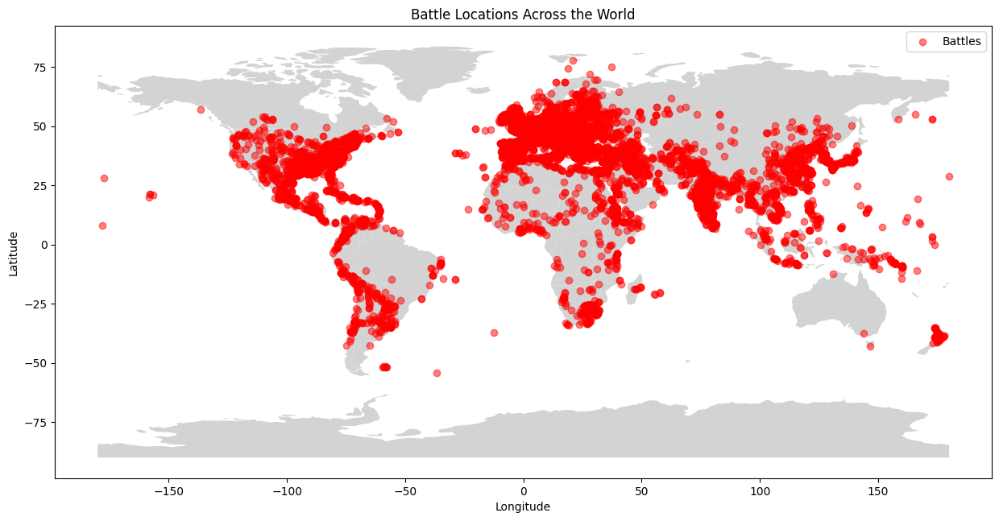

In [25]:
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
fig, ax = plt.subplots(figsize=(15,10))
world.plot(ax=ax, color='lightgray')
plt.scatter(battles['longitude'], battles['latitude'], c='red', alpha=0.5, label='Battles')
plt.title('Battle Locations Across the World')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend()
plt.show()

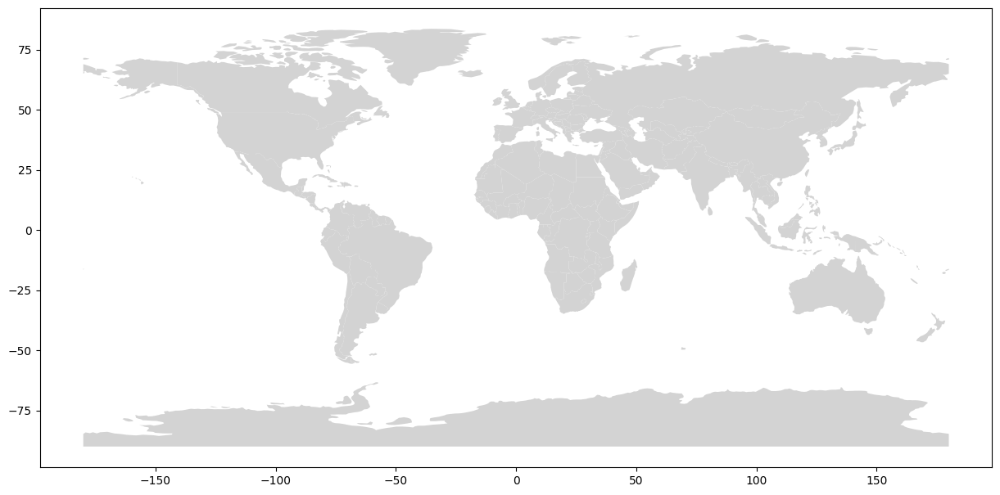

In [26]:
import matplotlib.animation as animation

fig, ax = plt.subplots(figsize=(15, 10))
world.plot(ax=ax, color='lightgray')

def update(frame):
    ax.clear()
    world.plot(ax=ax, color='lightgray')
    battles_filtered = battles[battles['date'].dt.year == frame]
    plt.scatter(battles_filtered['longitude'], battles_filtered['latitude'], c='red', alpha=0.5)
    plt.title(f'Battle Locations in {frame}')
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')

ani = animation.FuncAnimation(fig, update, frames=range(1800, 2025), repeat=False)
plt.show()


/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



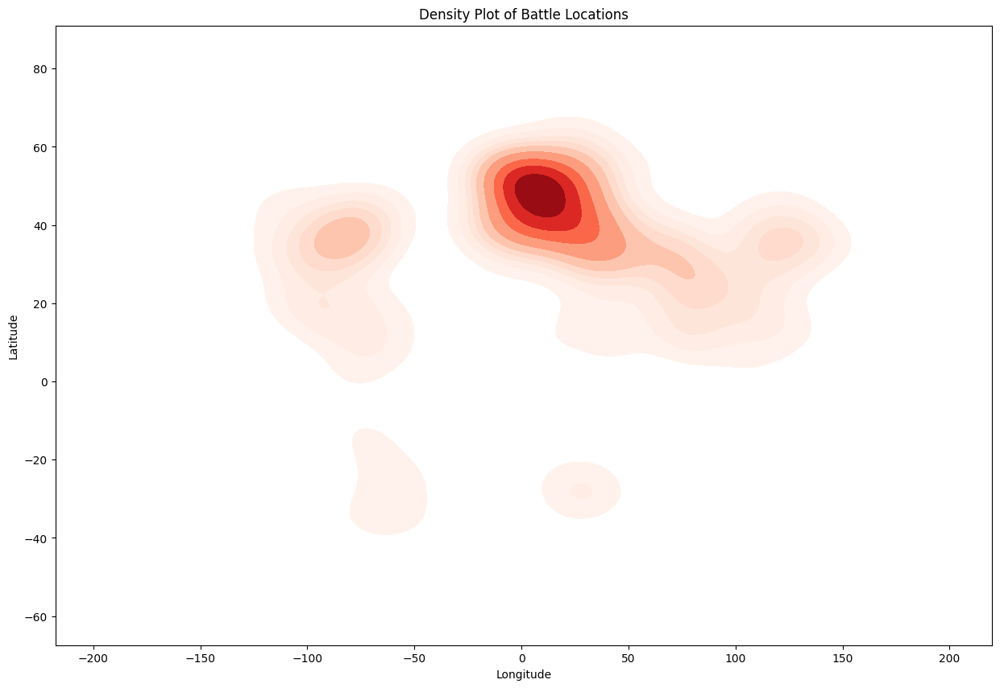

In [27]:
import seaborn as sns

plt.figure(figsize=(15, 10))
sns.kdeplot(data=battles, x='longitude', y='latitude', cmap='Reds', fill=True, thresh=0.1)
plt.title('Density Plot of Battle Locations')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()


In [28]:
import folium

import folium
from IPython.display import display

# Create a map centered around the average coordinates
m = folium.Map(location=[battles['latitude'].mean(), battles['longitude'].mean()], zoom_start=2)

# Add battle locations as markers
for idx, row in battles.iterrows():
    folium.CircleMarker(location=(row['latitude'], row['longitude']),
                        radius=5,
                        color='red',
                        fill=True,
                        fill_color='red',
                        fill_opacity=0.5).add_to(m)

# Display the map
display(m)



/opt/conda/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



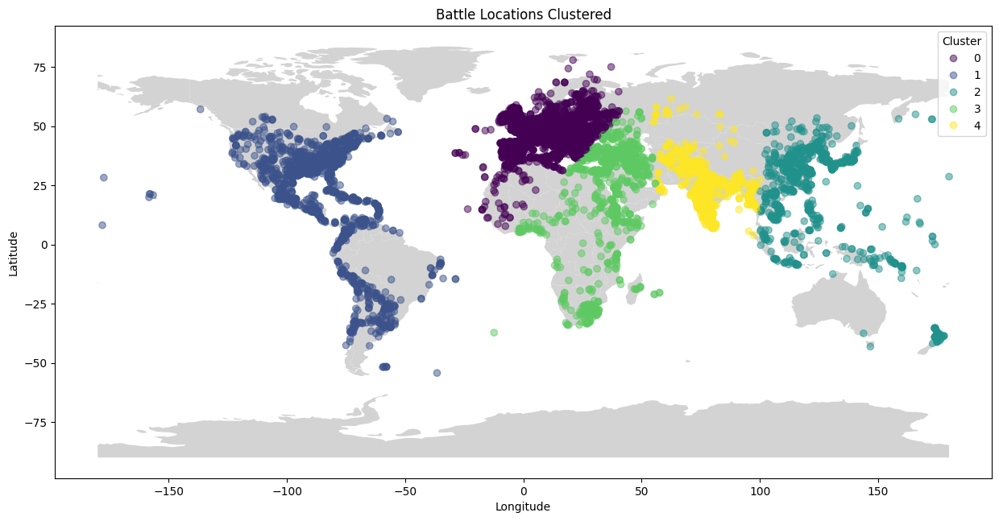

In [29]:
from sklearn.cluster import KMeans

# Clustering
coords = battles[['longitude', 'latitude']].values
kmeans = KMeans(n_clusters=5, random_state=0).fit(coords)
battles['cluster'] = kmeans.labels_

fig, ax = plt.subplots(figsize=(15, 10))
world.plot(ax=ax, color='lightgray')
scatter = plt.scatter(battles['longitude'], battles['latitude'], c=battles['cluster'], cmap='viridis', alpha=0.5)
plt.title('Battle Locations Clustered')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend(*scatter.legend_elements(), title='Cluster')
plt.show()


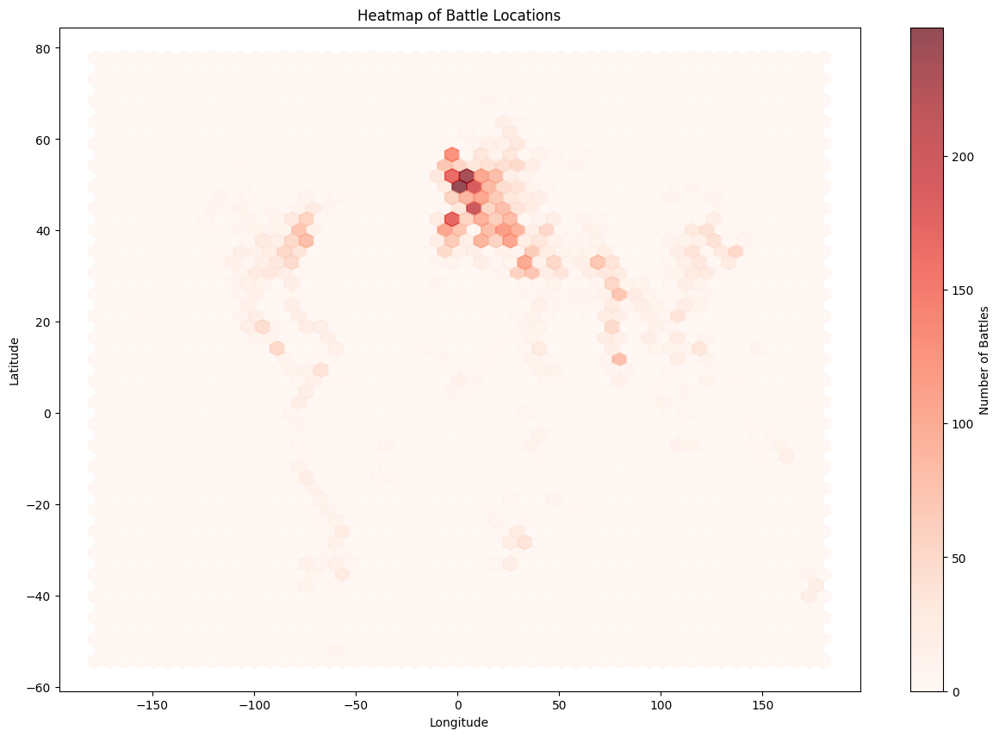

In [30]:
import seaborn as sns
import numpy as np
import pandas as pd

# Create a dataframe for plotting
heatmap_data = pd.DataFrame({
    'longitude': battles['longitude'],
    'latitude': battles['latitude']
})

# Plot using seaborn's hexbin plot for density heatmap
plt.figure(figsize=(15, 10))
plt.hexbin(heatmap_data['longitude'], heatmap_data['latitude'], gridsize=50, cmap='Reds', alpha=0.7)
plt.colorbar(label='Number of Battles')
plt.title('Heatmap of Battle Locations')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()


**2**

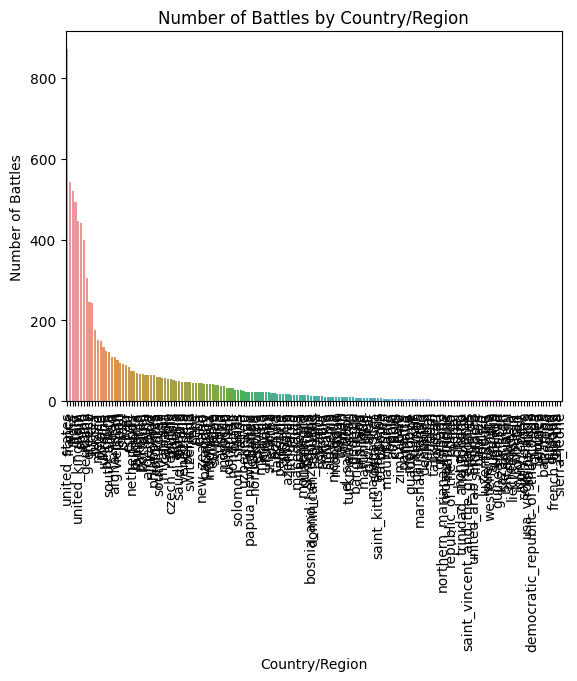

In [31]:
# Counting battles per region or country
battle_counts = battles['area'].value_counts().reset_index()
battle_counts.columns = ['Country/Region', 'Number of Battles']

# Bar plot visualization
import seaborn as sns
sns.barplot(data=battle_counts, x='Country/Region', y='Number of Battles')
plt.title('Number of Battles by Country/Region')
plt.xticks(rotation=90)
plt.show()


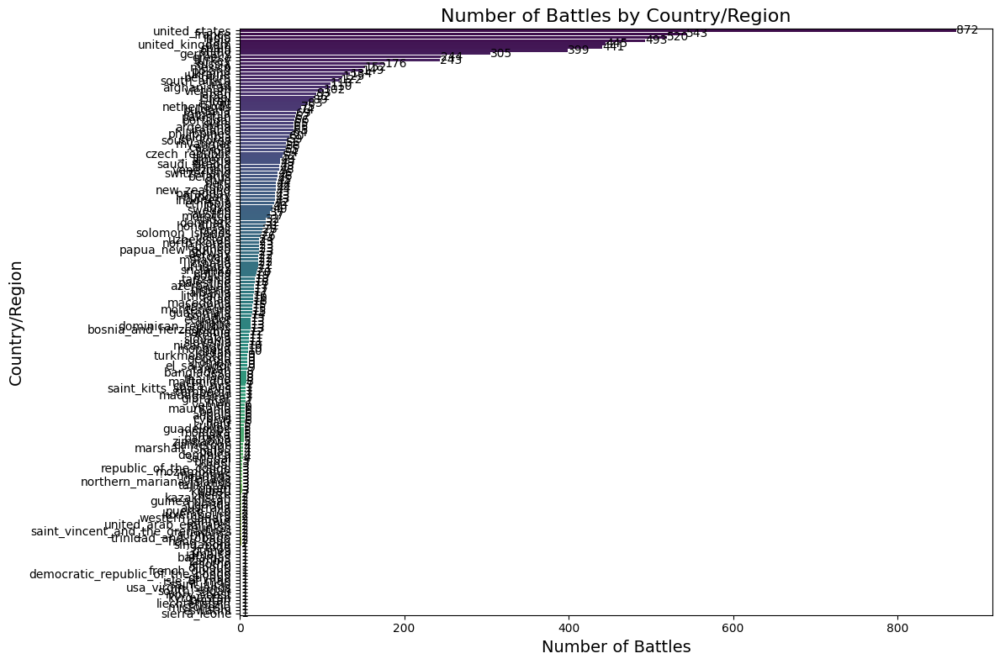

In [32]:
import matplotlib.pyplot as plt
import seaborn as sns

# Sort battle counts in descending order
battle_counts_sorted = battle_counts.sort_values(by='Number of Battles', ascending=False)

# Set figure size
plt.figure(figsize=(12, 8))

# Create horizontal bar plot
sns.barplot(data=battle_counts_sorted, y='Country/Region', x='Number of Battles', palette='viridis')

# Add data labels
for index, value in enumerate(battle_counts_sorted['Number of Battles']):
    plt.text(value, index, str(value), va='center', ha='left', fontsize=10)

# Add titles and labels
plt.title('Number of Battles by Country/Region', fontsize=16)
plt.xlabel('Number of Battles', fontsize=14)
plt.ylabel('Country/Region', fontsize=14)

# Show the plot
plt.tight_layout()
plt.show()


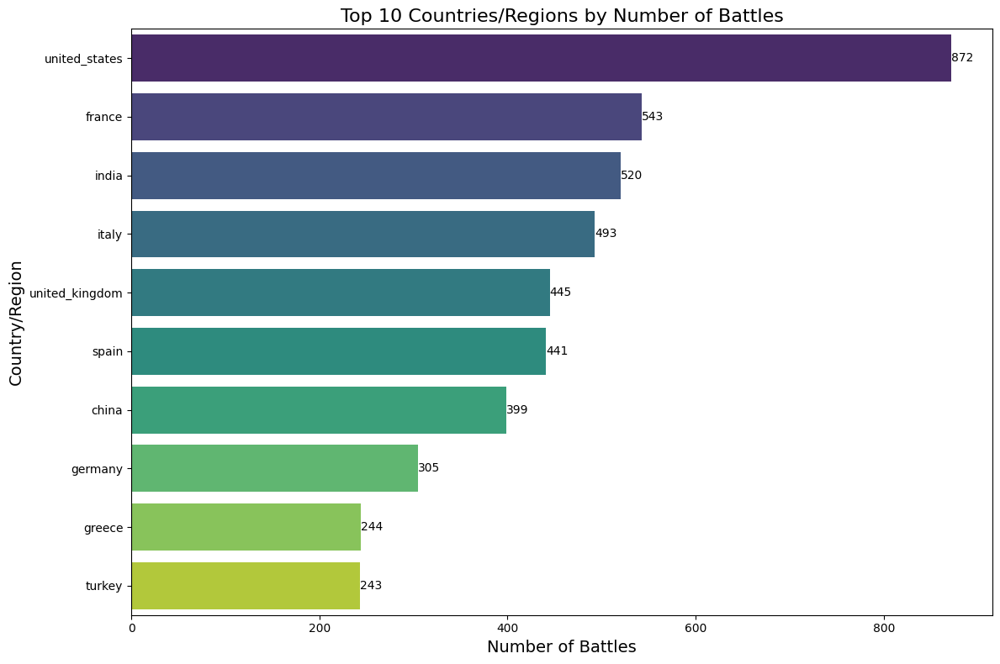

In [33]:
import matplotlib.pyplot as plt
import seaborn as sns

# Focus on the top 10 countries/regions with the most battles
top_n = 10
top_battle_counts = battle_counts.head(top_n)

# Set figure size
plt.figure(figsize=(12, 8))

# Create horizontal bar plot
sns.barplot(data=top_battle_counts, y='Country/Region', x='Number of Battles', palette='viridis')

# Add data labels
for index, value in enumerate(top_battle_counts['Number of Battles']):
    plt.text(value, index, str(value), va='center', ha='left', fontsize=10)

# Add titles and labels
plt.title(f'Top {top_n} Countries/Regions by Number of Battles', fontsize=16)
plt.xlabel('Number of Battles', fontsize=14)
plt.ylabel('Country/Region', fontsize=14)

# Show the plot
plt.tight_layout()
plt.show()


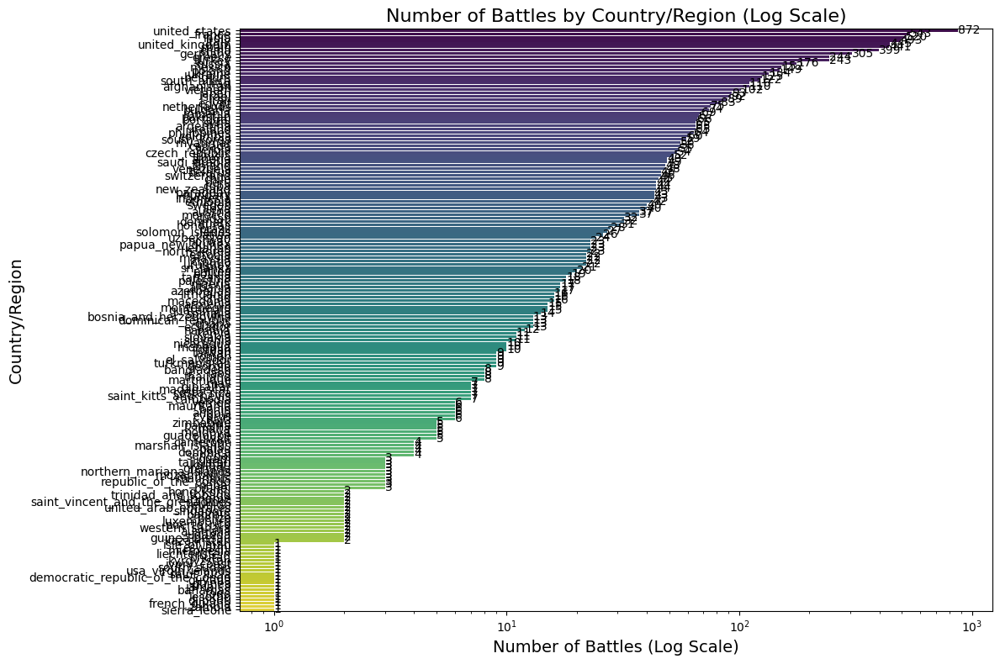

In [34]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set figure size
plt.figure(figsize=(12, 8))

# Create horizontal bar plot with log scale
sns.barplot(data=battle_counts, y='Country/Region', x='Number of Battles', palette='viridis')

# Set log scale for x-axis
plt.xscale('log')

# Add data labels
for index, value in enumerate(battle_counts['Number of Battles']):
    plt.text(value, index, str(value), va='center', ha='left', fontsize=10)

# Add titles and labels
plt.title('Number of Battles by Country/Region (Log Scale)', fontsize=16)
plt.xlabel('Number of Battles (Log Scale)', fontsize=14)
plt.ylabel('Country/Region', fontsize=14)

# Show the plot
plt.tight_layout()
plt.show()


In [35]:

# Create an interactive bar plot
fig = px.bar(battle_counts, y='Country/Region', x='Number of Battles', color='Number of Battles',
             title='Number of Battles by Country/Region',
             labels={'Country/Region': 'Country/Region', 'Number of Battles': 'Number of Battles'},
             text='Number of Battles')

# Update layout
fig.update_layout(
    xaxis_title='Number of Battles',
    yaxis_title='Country/Region',
    xaxis=dict(type='linear'),
    yaxis=dict(tickmode='linear'),
    autosize=True,
)

# Display the plot
fig.show()


In [36]:
# 1. Treemap

#     Description: A treemap displays hierarchical (tree-structured) data as a set of nested rectangles. The size and color of the rectangles represent different data attributes.
#     Use: Effective for showing proportions and comparisons between different categories in a compact space.

In [37]:
import plotly.express as px

# Create a treemap
fig = px.treemap(battle_counts, path=['Country/Region'], values='Number of Battles',
                 color='Number of Battles', color_continuous_scale='Viridis',
                 title='Number of Battles by Country/Region')

# Display the plot
fig.show()


In [38]:
# 2. Pie Chart

#     Description: A pie chart shows proportions of a whole. It can be useful for understanding the relative sizes of categories.
#     Use: Good for comparing a few categories, especially when you want to highlight proportions.

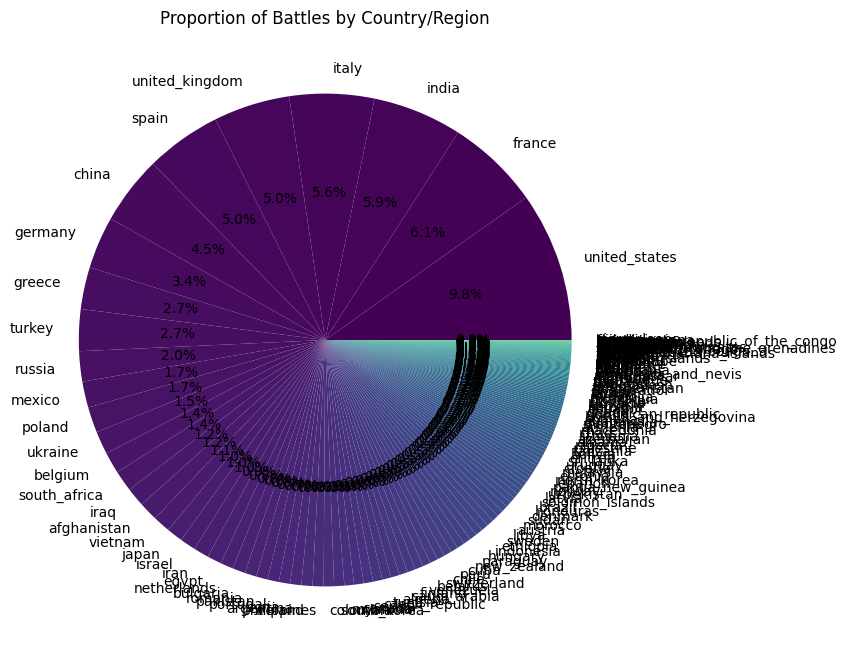

In [39]:
import matplotlib.pyplot as plt

# Create a pie chart
plt.figure(figsize=(10, 8))
plt.pie(battle_counts['Number of Battles'], labels=battle_counts['Country/Region'], autopct='%1.1f%%', colors=plt.cm.viridis(range(len(battle_counts))))
plt.title('Proportion of Battles by Country/Region')
plt.show()


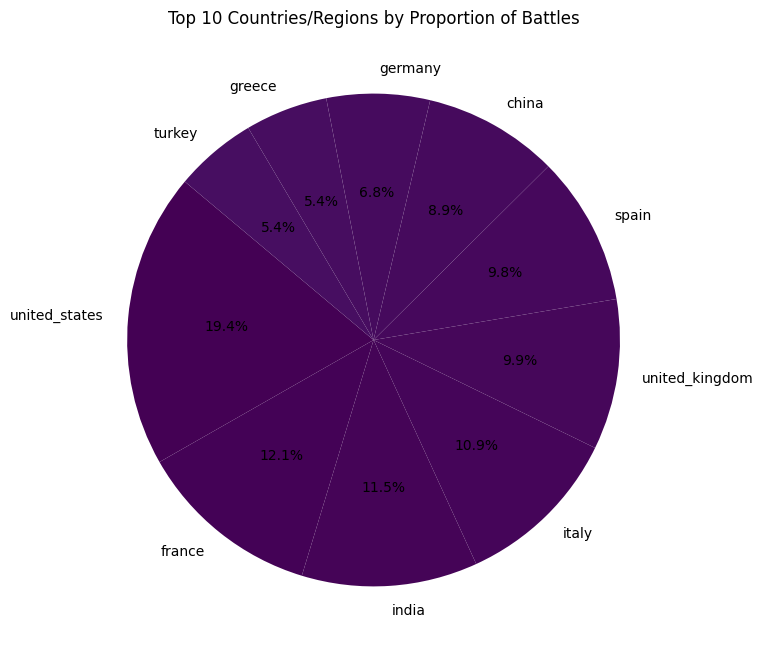

In [40]:
import matplotlib.pyplot as plt

# Get the top 10 countries/regions with the most battles
top_n = 10
top_battle_counts = battle_counts.head(top_n)

# Create a pie chart
plt.figure(figsize=(10, 8))
plt.pie(top_battle_counts['Number of Battles'], 
        labels=top_battle_counts['Country/Region'], 
        autopct='%1.1f%%', 
        colors=plt.cm.viridis(range(len(top_battle_counts))),
        startangle=140)  # Starting angle for better aesthetics

plt.title('Top 10 Countries/Regions by Proportion of Battles')
plt.show()


In [41]:
# 3. Dot Plot

#     Description: A dot plot displays data points on a single axis, which can be more readable for small datasets.
#     Use: Useful for visualizing distributions and for cases where precise values are important.

/tmp/ipykernel_36/1832184068.py:6: FutureWarning:

Passing `palette` without assigning `hue` is deprecated.

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



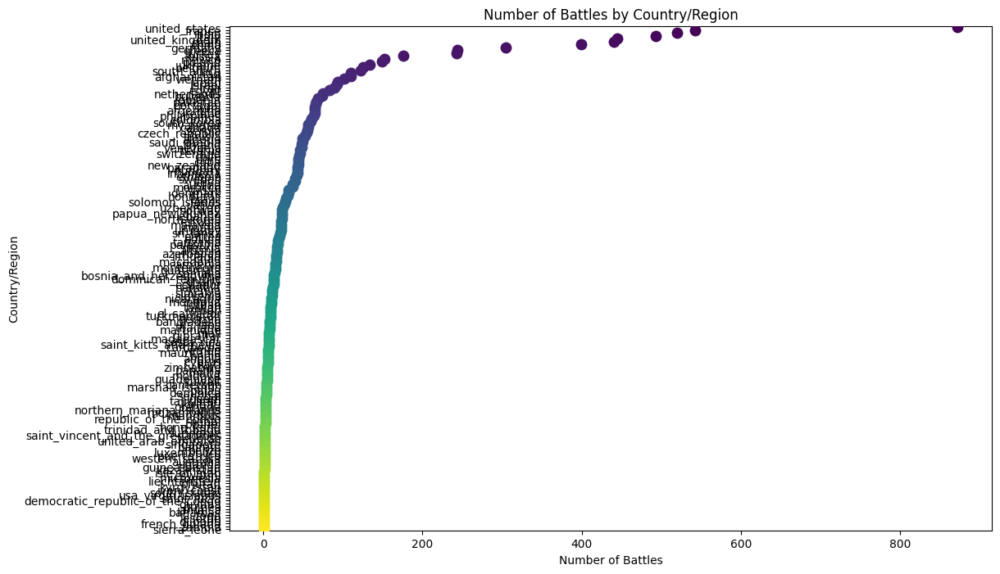

In [42]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create a dot plot
plt.figure(figsize=(12, 8))
sns.stripplot(data=battle_counts, y='Country/Region', x='Number of Battles', jitter=True, palette='viridis', size=10)
plt.title('Number of Battles by Country/Region')
plt.xlabel('Number of Battles')
plt.ylabel('Country/Region')
plt.show()


In [43]:
# 4. Box Plot

#     Description: A box plot provides a summary of the distribution of data through quartiles, highlighting the median, quartiles, and potential outliers.
#     Use: Useful for visualizing the spread and identifying outliers in your data.

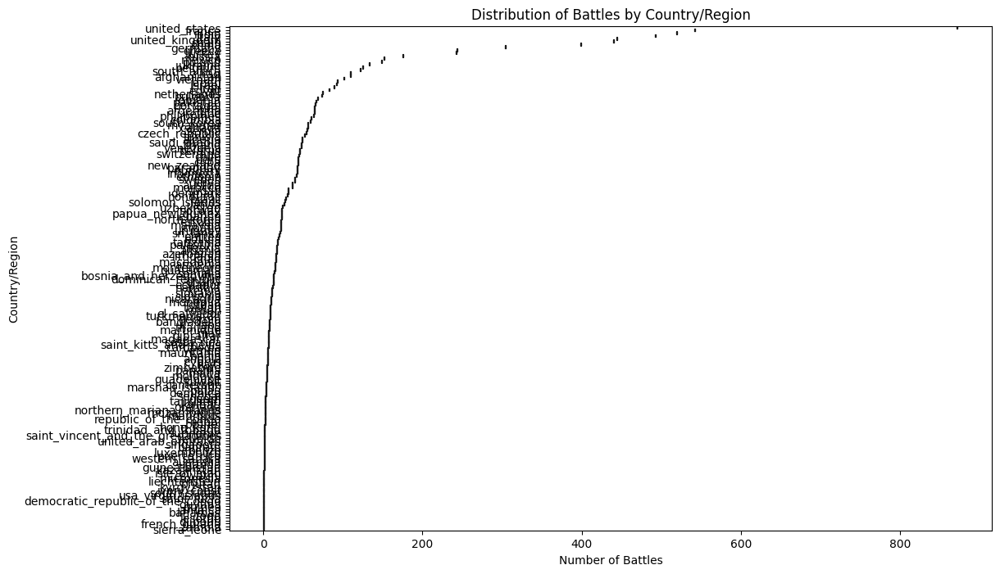

In [44]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create a box plot
plt.figure(figsize=(12, 8))
sns.boxplot(data=battle_counts, y='Country/Region', x='Number of Battles', palette='viridis')
plt.title('Distribution of Battles by Country/Region')
plt.xlabel('Number of Battles')
plt.ylabel('Country/Region')
plt.show()

In [45]:
# 5. Bubble Plot

#     Description: A bubble plot is similar to a scatter plot but uses the size of the markers to represent an additional dimension.
#     Use: Useful when you have an extra variable to represent, such as battle intensity or historical significance.

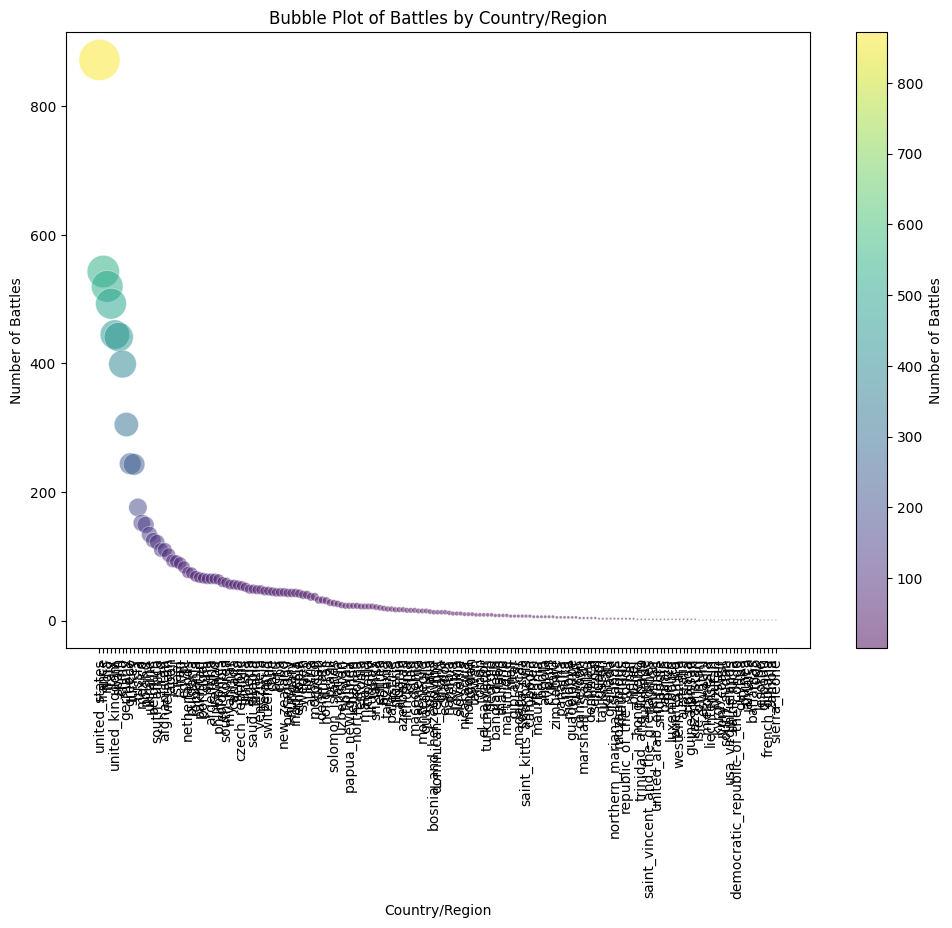

In [46]:
import matplotlib.pyplot as plt

# Create a bubble plot
plt.figure(figsize=(12, 8))
plt.scatter(battle_counts['Country/Region'], battle_counts['Number of Battles'],
            s=battle_counts['Number of Battles'], alpha=0.5, c=battle_counts['Number of Battles'], cmap='viridis', edgecolors='w', linewidth=0.5)
plt.title('Bubble Plot of Battles by Country/Region')
plt.xlabel('Country/Region')
plt.ylabel('Number of Battles')
plt.xticks(rotation=90)
plt.colorbar(label='Number of Battles')
plt.show()


In [47]:
# 6. Stacked Bar Plot

#     Description: A stacked bar plot can show the distribution of battles over different regions with stacked bars.
#     Use: Effective if you want to visualize the contribution of each region to the total.

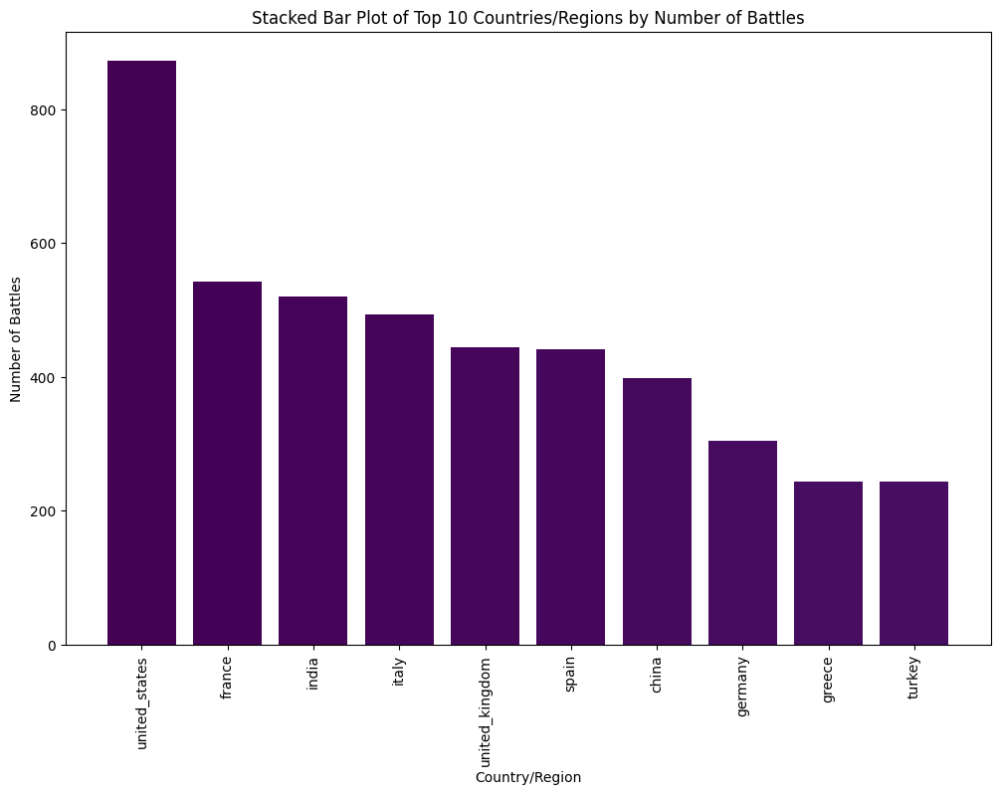

In [48]:
import matplotlib.pyplot as plt

# Prepare data for stacked bar plot
top_n = 10
top_battle_counts = battle_counts.head(top_n)
plt.figure(figsize=(12, 8))
plt.bar(top_battle_counts['Country/Region'], top_battle_counts['Number of Battles'], color=plt.cm.viridis(range(len(top_battle_counts))))
plt.xticks(rotation=90)
plt.title(f'Stacked Bar Plot of Top {top_n} Countries/Regions by Number of Battles')
plt.xlabel('Country/Region')
plt.ylabel('Number of Battles')
plt.show()


In [49]:
# 7. Density Plot

#     Description: A density plot shows the distribution and density of battles across regions.
#     Use: Good for understanding the overall distribution of battles and regions.

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



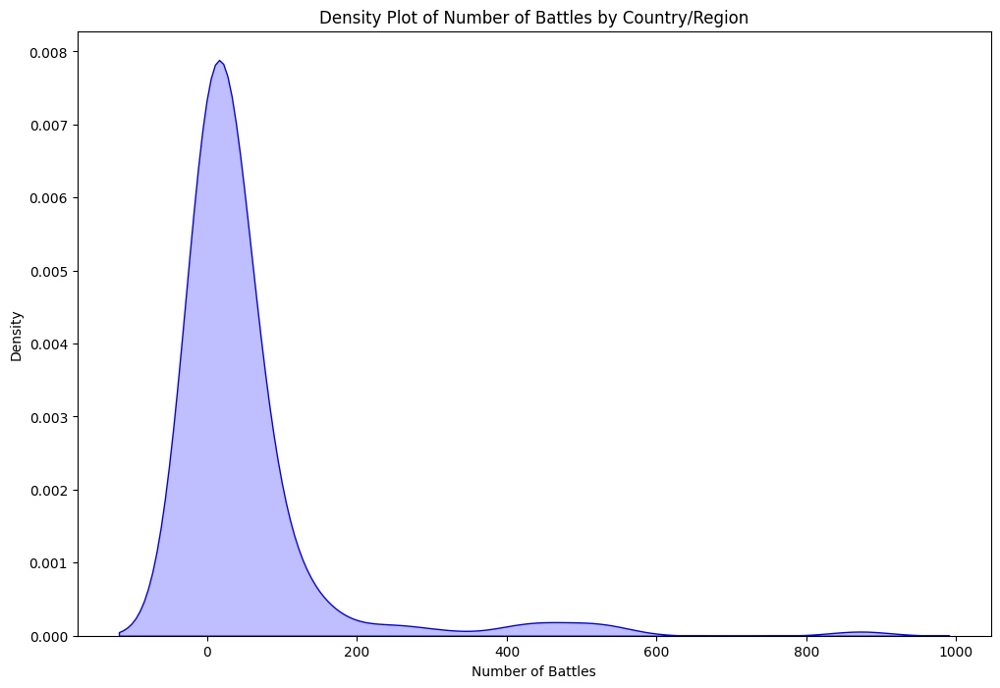

In [50]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 8))
sns.kdeplot(data=battle_counts, x='Number of Battles', fill=True, color='blue')
plt.title('Density Plot of Number of Battles by Country/Region')
plt.xlabel('Number of Battles')
plt.ylabel('Density')
plt.show()


# **What was the relationship between battle outcomes and regions?

    Visualization: A stacked bar plot or map with color-coded markers to differentiate between winners and losers by region.
        Tool: Matplotlib or Seaborn.
        Why this graph: Helps in visualizing the success or loss of different regions in battle.
        How to interpret: Regions where one side consistently wins might indicate stronger political or military power.******

In [51]:
# # Step 1: Determine the top 10 regions with the most battles
# battle_counts = battles['area'].value_counts().reset_index()
# battle_counts.columns = ['Region', 'Number of Battles']
# top_regions = battle_counts.head(10)['Region']

# # Step 2: Filter battles data for the top 10 regions
# filtered_battles = battles[battles['area'].isin(top_regions)]

# # Step 3: Calculate outcomes for these top 10 regions
# outcome_counts = filtered_battles.groupby(['area', 'winner']).size().unstack().fillna(0)

# # Step 4: Create the stacked bar plot
# ax = outcome_counts.plot(kind='bar', stacked=True, colormap='viridis', figsize=(12, 8))

# # Add the title and labels
# plt.title('Battle Outcomes by Top 10 Regions')
# plt.xlabel('Region')
# plt.ylabel('Number of Battles')
# plt.xticks(rotation=90)

# # Customize legend to show country names
# handles, labels = ax.get_legend_handles_labels()
# # Add a legend for the regions (country names)
# ax.legend(handles, [f'{region} - {label}' for region in outcome_counts.index for label in outcome_counts.columns],
#           title='Winner', bbox_to_anchor=(1.05, 1), loc='upper left')

# # Adjust layout to fit everything
# plt.tight_layout()
# plt.show()

In [52]:
# import matplotlib.pyplot as plt

# # Create a stacked area plot
# outcome_counts.plot(kind='area', stacked=True, colormap='viridis', figsize=(12, 8))

# # Add the title and labels
# plt.title('Battle Outcomes by Top 10 Regions')
# plt.xlabel('Region')
# plt.ylabel('Number of Battles')
# plt.xticks(rotation=90)

# # Adjust layout to fit everything
# plt.tight_layout()
# plt.show()


In [53]:
# import matplotlib.pyplot as plt

# # Create a grouped bar plot
# outcome_counts.plot(kind='bar', colormap='viridis', figsize=(12, 8), width=0.8)

# # Add the title and labels
# plt.title('Battle Outcomes by Top 10 Regions')
# plt.xlabel('Region')
# plt.ylabel('Number of Battles')
# plt.xticks(rotation=90)

# # Adjust layout to fit everything
# plt.tight_layout()
# plt.show()


In [54]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from math import pi

# Assuming 'outcome_counts' is a DataFrame with regions as index and outcomes as columns

# Select the top 10 regions based on some criteria (e.g., highest sum of outcomes)
top_regions = outcome_counts.sum(axis=1).nlargest(10).index
outcome_counts_top10 = outcome_counts.loc[top_regions]

# Prepare data for radar chart
categories = outcome_counts_top10.columns
num_vars = len(categories)

# Create a radar chart
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
angles += angles[:1]  # Complete the loop

fig, ax = plt.subplots(figsize=(10, 8), subplot_kw=dict(polar=True))
for region in outcome_counts_top10.index:
    values = outcome_counts_top10.loc[region].tolist()
    values += values[:1]  # Complete the loop
    ax.plot(angles, values, label=region)
    ax.fill(angles, values, alpha=0.25)

# Add the title and labels
plt.title('Radar Chart of Battle Outcomes by Top 10 Regions')
ax.set_xticks(angles[:-1])
ax.set_xticklabels(categories)
plt.legend(loc='upper right', bbox_to_anchor=(1.1, 1.1))
plt.show()


NameError: name 'outcome_counts' is not defined

# ****Were battles more frequent in certain regions over time?

    Visualization: A line plot with time on the x-axis and the number of battles per region on the y-axis.
        Tool: Matplotlib or Seaborn.
        Why this graph: Shows the frequency of battles over time, helping to identify if wars clustered in particular periods.
        How to interpret: Spikes in certain years can be linked to major wars, while steady frequencies may indicate prolonged conflicts.

In [ ]:
# # Grouping battles by year and area
# time_battles = battles.groupby(['year', 'area']).size().unstack().fillna(0)

# # Line plot for battle frequency over time
# time_battles.plot(kind='line', figsize=(15, 8))
# plt.title('Battle Frequency Over Time by Region')
# plt.xlabel('Year')
# plt.ylabel('Number of Battles')
# plt.show()


# Were longer battles more localized, or did they occur in a broader geographic spread?

    Visualization: A scatter plot of battle duration versus geographic location (latitude/longitude).
        Tool: Matplotlib.
        Why this graph: This helps in observing if longer battles were concentrated in specific areas.
        How to interpret: If long-duration battles cluster in certain regions, these areas likely faced prolonged conflict. If spread out, it shows broader, scattered war impacts.

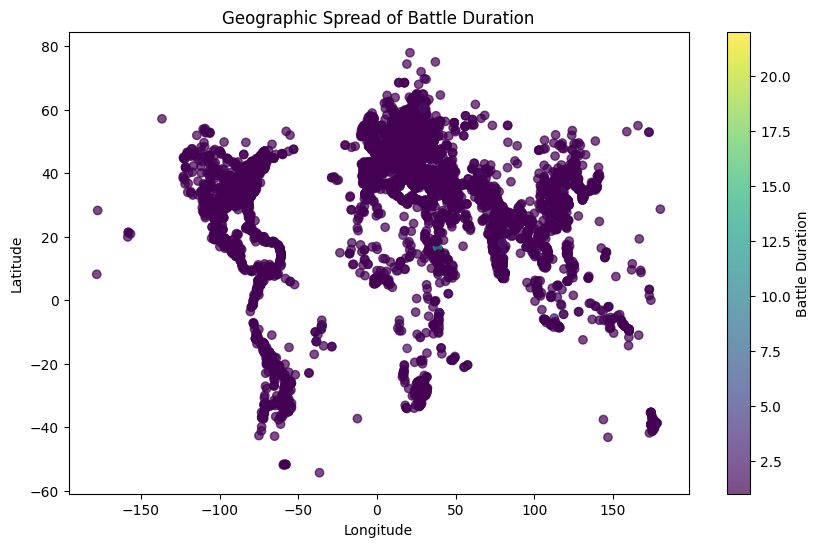

In [55]:
# Scatter plot of battle duration and geographic location
plt.figure(figsize=(10, 6))
plt.scatter(battles['longitude'], battles['latitude'], c=battles['duration'], cmap='viridis', alpha=0.7)
plt.colorbar(label='Battle Duration')
plt.title('Geographic Spread of Battle Duration')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()
